# Project 1 What Makes You Happy?
### _Author: Fei Zheng_

## 0. Preparation

A general descriptions for the libraries from official documents:  
+ `sys`: This module provides access to some variables used or maintained by the interpreter and to functions that interact strongly with the interpreter.
+ `warning`: Warning messages are typically issued in situations where it is useful to alert the user of some condition in a program, where that condition (normally) doesn’t warrant raising an exception and terminating the program.
+ `re`: This module provides regular expression matching operations similar to those found in Perl.
+ `random`: This module implements pseudo-random number generators for various distributions.
+ `pandas`: Pandas provides high-performance, easy-to-use data structures and data analysis tools for the Python programming language.
+ `numpy`: NumPy is the fundamental package for scientific computing in Python.
+ `matplotlib`: Matplotlib is a Python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms.
+ `nltk`: NLTK is a leading platform for building Python programs to work with human language data.  
  
There are some other libraries and functions I will use later. Following the general rule, I will import them when necessary, where the description will be attached also.

In [1]:
# load libraries and functions
from __future__ import print_function
import sys
import warnings
import re
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nltk

In [3]:
# append the function folder to the system path
sys.path.append('../lib')
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", FutureWarning)

In [4]:
# print the python version
print(sys.version)

3.6.8 |Anaconda, Inc.| (default, Dec 29 2018, 19:04:46) 
[GCC 4.2.1 Compatible Clang 4.0.1 (tags/RELEASE_401/final)]


## 1. Load the data and have a general view

In [4]:
# read the data from subfolder `data` in the project
hm_data = pd.read_csv('../data/HappyDB/happydb/data/cleaned_hm.csv')

First, let's geta general sense of the data!  
For convenience, here is a variables' descriotion copied from official github documents.  
+ __hmid (int)__: Happy moment ID
+ __wid (int)__: Worker ID
+ __reflection_period (str)__: Reflection period used in the instructions provided to the worker (3m or 24h)
+ __original_hm (str)__: Original happy moment
+ __cleaned_hm (str)__: Cleaned happy moment
+ __modified (bool)__: If True, original_hm is "cleaned up" to generate cleaned_hm (True or False)
+ __predicted_category (str)__: Happiness category label predicted by our classifier (7 categories. Please see the reference for details)
+ __ground_truth_category (str)__: Ground truth category label. The value is NaN if the ground truth label is missing for the happy moment
+ __num_sentence (int)__: Number of sentences in the happy moment

In [5]:
hm_data.head(10)

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category
0,27673,2053,24h,I went on a successful date with someone I fel...,I went on a successful date with someone I fel...,True,1,NaN,affection
1,27674,2,24h,I was happy when my son got 90% marks in his e...,I was happy when my son got 90% marks in his e...,True,1,NaN,affection
2,27675,1936,24h,I went to the gym this morning and did yoga.,I went to the gym this morning and did yoga.,True,1,NaN,exercise
3,27676,206,24h,We had a serious talk with some friends of our...,We had a serious talk with some friends of our...,True,2,bonding,bonding
4,27677,6227,24h,I went with grandchildren to butterfly display...,I went with grandchildren to butterfly display...,True,1,NaN,affection
5,27678,45,24h,I meditated last night.,I meditated last night.,True,1,leisure,leisure
6,27679,195,24h,"I made a new recipe for peasant bread, and it ...","I made a new recipe for peasant bread, and it ...",True,1,NaN,achievement
7,27680,740,24h,I got gift from my elder brother which was rea...,I got gift from my elder brother which was rea...,True,1,NaN,affection
8,27681,3,24h,YESTERDAY MY MOMS BIRTHDAY SO I ENJOYED,YESTERDAY MY MOMS BIRTHDAY SO I ENJOYED,True,1,NaN,enjoy_the_moment
9,27682,4833,24h,Watching cupcake wars with my three teen children,Watching cupcake wars with my three teen children,True,1,NaN,affection


Obviously, `cleaned_hm` must be my main focus.  
There are so many missing values in `ground_truth_category` that makes it difficult to deal with.  
Luckily, we have `predicted_category` which has 7 categories. This might provide some useful information!  
And also, official database provides some affiliated `.csv` documents(e.g., `senselabel.csv`, `pets-dict.csv`) which might be useful later.   

## 2. Text Preprocessing

Whatever, let's first process `cleaned_hm`.  
Generally, there are several standard steps for text preprocessing. I summarize below:    
1. Transform sentences into words, which is also called `tokenization`.  
2. Tag the part of speech, which is called `POS Tagging`(Optional).   
3. Remove the punctuation and non-alpha words(e.g. numbers, whitespace).  
4. Correct the spelling mistakes.  
5. Transform all words into lowercase. 
6. `Lemmatization/Stemming`.  
7. Remove too short words and stopwords.

#### Step1. Tokenization

In [6]:
hm = hm_data['cleaned_hm'].copy()
token_hm = [nltk.word_tokenize(sent) for sent in hm]

#### Step2. POS tagging

In [7]:
pos_hm = [nltk.pos_tag(sent) for sent in token_hm]

#### Step3. Remove the punctuation and non-alpha words

`string.punctuation`: This is a string of ASCII characters which are considered punctuation characters in the C locale.  
!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~

In [8]:
from string import punctuation
punct_hm = [[tup for tup in sent if re.search(r'\D+', tup[0]) and tup[0] not in list(punctuation) 
            and tup[0] not in ["'s","'d","'ll",'',"'m","'ve"]]
             for sent in pos_hm]

#### Step4. Check the spelling mistakes

`pyenchant`: This package provides a set of Python language bindings for the Enchant spellchecking library.[@rfk/pyenchant](https://github.com/rfk/pyenchant)

In [9]:
import enchant
d = enchant.Dict('en_US') # US English
check_hm = [[d.check(tup[0]) for tup in sent] for sent in punct_hm]
num_mis = len([word for sent in check_hm for word in sent if word == False])
print('There are {0} spelling mistakes. The mistake rate is {1:.2f}%'.format(num_mis,
    100 * num_mis/len([word for sent in check_hm for word in sent])))

There are 34889 spelling mistakes. The mistake rate is 1.90%


Let's have a look at what kind of the spelling mistakes they are.

In [10]:
# get all the indexes for the spelling mistake(False)
indexes = [[i,j] for i in range(len(check_hm)) for j,x in enumerate(check_hm[i]) if x == False]

# randomly choose 10 some spelling mistakes
random.seed(1)
for i in range(10):
    choice = random.choice(range(len(indexes)))
    idx1 = indexes[choice][0]
    idx2 = indexes[choice][1]
    print('The mistake word is: {0}.\nThe sentence is: {1} \n'.format(punct_hm[idx1][idx2][0], hm[idx1]))

The mistake word is: glitched.
The sentence is: I got a free pack of cigarettes because the computer glitched out when I went to pay. 

The mistake word is: n't.
The sentence is: My knee didn't hurt all day. 

The mistake word is: Overwatch.
The sentence is: I managed to properly figure out how a recent update to Overwatch would impact the DPS of various characters, and how that might affect balance. 

The mistake word is: cryptocurrency.
The sentence is: The coin on a cryptocurrency exchange that I was hoping would drop in price so I could buy it, droppedd a lot in price and I was able to buy a lot of it for cheap. 

The mistake word is: harvard.
The sentence is: My kids will be able to see thier farther go to harvard 

The mistake word is: Veenhoven.
The sentence is: happiness in terms of living a good life, or flourishing, rather than simply as an emotion. Happiness in this sense was used to translate the Greek eudaimonia, and is still used in virtue ethics. There has been a transit

From the random examples above, some mistakes come from abbreviation(e.g. **don't** will be tokenized into **do** and **n't**) which is very meaningful and can be partly dealt with by **POS tagging** in **nltk**. Some other mistakes come from special words(e.g **harvard**, **facebook**).  
  
It's tough to deal with such spelling problems. Considering the low misspelling rate, we could just ignore them.  

#### Step5. Transform to lowercase

In [11]:
lower_hm = [[(tup[0].lower(), tup[1]) for tup in sent] for sent in punct_hm]

#### Step6. Lemmatization

In [12]:
# def the function that convert the POS from original form to consistent form
from nltk.corpus import wordnet
def get_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

In [13]:
wnl = nltk.WordNetLemmatizer()
lemma_hm = [[(wnl.lemmatize(tup[0], get_pos(tup[1])), tup[1]) for tup in sent]for sent in lower_hm]

#### Step6. Remove too short words and stopwords

In [14]:
# remove words whose length < 3 and remove stopwords
from nltk.corpus import stopwords
words = stopwords.words('english') + ["happy","ago","yesterday","lot","today","month","last","week","past",
                                     "get","make","day","n't","take","year","time"]
stop_hm = [[tup for tup in sent 
            if len(tup[0]) >= 3 and tup[0] not in words and not re.search(r"^\'[a-zA-Z]", tup[0])] 
           for sent in lemma_hm]

#### Step7. Combine the processed text to the original data and export

In [15]:
hm_data['processed_hm'] = [' '.join([tup[0] for tup in sent]) for sent in stop_hm]
hm_data.to_csv('../output/processed_hm.csv', index=False)

## 3. Exploratory Data Analysis

#### Step1. Combine the processed data with demographic data

In [34]:
hm_data = pd.read_csv('../output/processed_hm.csv')
demo_data = pd.read_csv('../data/HappyDB/happydb/data/demographic.csv')
hm_data = hm_data.merge(demo_data, on = 'wid', how = 'inner', copy=False)
hm_data.head(1)

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category,processed_hm,age,country,gender,marital,parenthood
0,27673,2053,24h,I went on a successful date with someone I fel...,I went on a successful date with someone I fel...,True,1,NaN,affection,successful date someone felt sympathy connection,35,USA,m,single,n


#### Step2. Select rows that satisfies specific row conditions and export

In [17]:
# transform Age to integer and count the words
def trans_age(age):
    try:
        return int(float(age))
    except:
        return np.nan
def word_count(words):
    try:
        return len(words.strip().split(' '))
    except:
        return np.nan

hm_data = hm_data.assign(age = hm_data['age'].map(trans_age),
                        word_count = hm_data['processed_hm'].map(word_count))

In [18]:
# filter the rows
hm_data_sub = hm_data.loc[(hm_data['gender'].isin(['m','f'])) &
                     (hm_data['marital'].isin(['single','married','divorced'])) &
                     (hm_data['parenthood'].isin(['n','y'])) &
                     (hm_data['reflection_period'].isin(['3m','24h']))&
                     (hm_data['age'].between(1,100)) &
                     (~hm_data['processed_hm'].isnull()) &
                     (hm_data['word_count'] > 1)
                         ,['wid','original_hm','cleaned_hm','predicted_category',
                          'processed_hm','age','country','gender','marital','parenthood']]

In [19]:
# export
hm_data_sub.to_csv('../output/subset_hm.csv', index = False)

#### Step3. Word Cloud

In [20]:
hm = pd.Series([words for sent in hm_data_sub['processed_hm'] for words in sent.strip().split(' ')])

Text(0.5, 1.0, 'The 20 most frequent words')

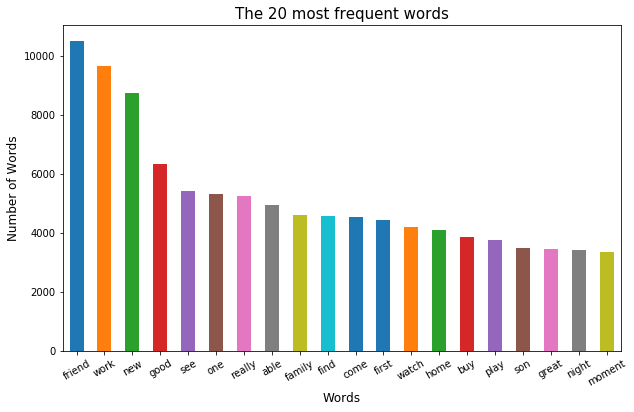

In [25]:
# count
plt.figure(figsize=(14,8))
hm.value_counts(ascending=False)[:20].plot.bar()
plt.xticks(rotation = 30)
plt.xlabel('Words', fontsize=12)
plt.ylabel('Number of Words', fontsize=12)
plt.title('The 20 most frequent words', fontsize=15)

In [26]:
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(stopwords=STOPWORDS, max_words=50, background_color="white")
wordcloud2 = wordcloud.generate_from_frequencies(dict(hm.value_counts()))

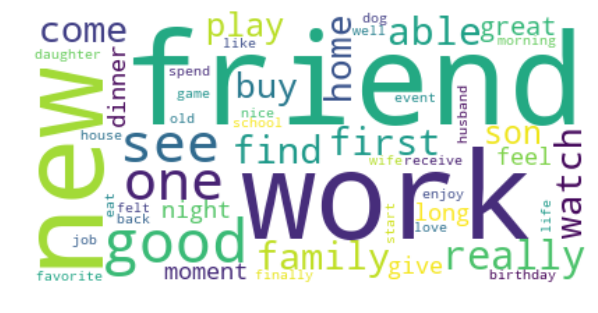

In [27]:
plt.figure(figsize=(10,8))
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis('off')
plt.show()

In [24]:
wordcloud2.to_file('../figs/wordcloud.png')

## 4. Model: Latent Dirichlet Analysis(LDA)

#### Step0. Import functions and data

In [5]:
hm_data = pd.read_csv('../output/subset_hm.csv')
hm = hm_data['processed_hm']
hm = [x for x in hm]

#### Step1.  TF-IDF

In information retrieval, **tf–idf** or TFIDF, short for term *frequency–inverse document frequency*, is a numerical statistic that is intended to reflect how important a word is to a document in a collection or corpus. It is often used as a weighting factor in searches of information retrieval, text mining, and user modeling. The tf–idf value increases proportionally to the number of times a word appears in the document and is offset by the number of documents in the corpus that contain the word, which helps to adjust for the fact that some words appear more frequently in general. [WIKI-tfidf](https://en.wikipedia.org/wiki/Tf%E2%80%93idf)

In [5]:
from sklearn.feature_extraction.text import TfidfVectorizer
num_features = 2000
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=num_features)
tfidf = tfidf_vectorizer.fit_transform(hm)
tfidf_feature_names = tfidf_vectorizer.get_feature_names()

In [13]:
len(tfidf_feature_names)

2000

In [6]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis
pyLDAvis.enable_notebook()

In [7]:
tf_vectorizer = CountVectorizer(strip_accents = 'unicode',
                                stop_words = 'english',
                                lowercase = True,
                                token_pattern = r'\b[a-zA-Z]{3,}\b',
                                max_df = 0.5, 
                                min_df = 10)
dtm_tf = tf_vectorizer.fit_transform(hm)
print(dtm_tf.shape)

(96804, 4438)


In [8]:
tfidf_vectorizer = TfidfVectorizer(**tf_vectorizer.get_params())
dtm_tfidf = tfidf_vectorizer.fit_transform(hm)

In [39]:
# for TF DTM
lda_tf = LatentDirichletAllocation(n_components=20, random_state=0)
lda_tf.fit(dtm_tf)

/Users/james/anaconda3/lib/python3.6/site-packages/sklearn/decomposition/online_lda.py:314: DeprecationWarning: n_topics has been renamed to n_components in version 0.19 and will be removed in 0.21
  DeprecationWarning)


LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='batch', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=10, mean_change_tol=0.001,
             n_components=10, n_jobs=None, n_topics=20, perp_tol=0.1,
             random_state=0, topic_word_prior=None,
             total_samples=1000000.0, verbose=0)

In [9]:
# for TFIDF DTM
lda_tfidf = LatentDirichletAllocation(n_components=15, random_state=0)
lda_tfidf.fit(dtm_tfidf)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='batch', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=10, mean_change_tol=0.001,
             n_components=15, n_jobs=None, n_topics=None, perp_tol=0.1,
             random_state=0, topic_word_prior=None,
             total_samples=1000000.0, verbose=0)

In [22]:
m = lda_tfidf.fit_transform(dtm_tfidf)

In [42]:
pyLDAvis.sklearn.prepare(lda_tf, dtm_tf, tf_vectorizer)
#pyLDAvis.sklearn.prepare(lda_tfidf, dtm_tfidf, tf_vectorizer, mds='tsne')

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12    -0.068352 -0.066502       1        1  8.142919
14     0.162247 -0.056594       2        1  7.268934
2      0.144974  0.049125       3        1  6.307262
17     0.227454  0.011335       4        1  5.778792
5      0.162269 -0.132234       5        1  5.710422
0     -0.105500 -0.142921       6        1  5.689782
9     -0.055260 -0.146795       7        1  5.603521
16     0.023351 -0.021805       8        1  5.243727
6      0.140266 -0.070350       9        1  5.206237
10    -0.239825  0.023071      10        1  4.934990
3     -0.176765 -0.032626      11        1  4.640606
4      0.000403 -0.113251      12        1  4.502037
19    -0.012009  0.312943      13        1  4.408752
1      0.056826 -0.067380      14        1  4.308038
13    -0.181972 -0.030535      15        1  4.199941
8     -0.008690  0.092278      16        1  3.844893
7     -0.084133  0.004237      17        1  3.803972
11    -0.073056 -0.029191      18        1  3.719238
15     0.143523  0.139043      19        1  3.465849
18    -0.055750  0.278152      20        1  3.220086, topic_info=     Category          Freq        Term         Total  loglift  logprob
term                                                                   
1625  Default  10002.000000      friend  10002.000000  30.0000  30.0000
4300  Default   4169.000000       watch   4169.000000  29.0000  29.0000
2628  Default   8682.000000         new   8682.000000  28.0000  28.0000
4387  Default   9683.000000        work   9683.000000  27.0000  27.0000
2     Default   4862.000000        able   4862.000000  26.0000  26.0000
1464  Default   4529.000000      family   4529.000000  25.0000  25.0000
535   Default   3786.000000         buy   3786.000000  24.0000  24.0000
2121  Default   3214.000000         job   3214.000000  23.0000  23.0000
1126  Default   3154.000000      dinner   3154.000000  22.0000  22.0000
1661  Default   3149.000000        game   3149.000000  21.0000  21.0000
1177  Default   2657.000000         dog   2657.000000  20.0000  20.0000
2921  Default   3802.000000        play   3802.000000  19.0000  19.0000
380   Default   2819.000000    birthday   2819.000000  18.0000  18.0000
1263  Default   2835.000000         eat   2835.000000  17.0000  17.0000
1540  Default   1977.000000      finish   1977.000000  16.0000  16.0000
2638  Default   3304.000000       night   3304.000000  15.0000  15.0000
4275  Default   1980.000000        walk   1980.000000  14.0000  14.0000
3654  Default   3444.000000         son   3444.000000  13.0000  13.0000
1931  Default   2263.000000       house   2263.000000  12.0000  12.0000
3181  Default   2661.000000     receive   2661.000000  11.0000  11.0000
574   Default   2049.000000         car   2049.000000  10.0000  10.0000
2269  Default   3334.000000        life   3334.000000   9.0000   9.0000
2540  Default   2575.000000     morning   2575.000000   8.0000   8.0000
2557  Default   1741.000000       movie   1741.000000   7.0000   7.0000
4355  Default   2246.000000         win   2246.000000   6.0000   6.0000
4252  Default   2038.000000       visit   2038.000000   5.0000   5.0000
1533  Default   3217.000000     finally   3217.000000   4.0000   4.0000
1015  Default   3150.000000    daughter   3150.000000   3.0000   3.0000
3433  Default   2287.000000      school   2287.000000   2.0000   2.0000
1487  Default   2885.000000    favorite   2885.000000   1.0000   1.0000
...       ...           ...         ...           ...      ...      ...
829   Topic20     57.198361   component     58.145463   3.4193  -5.8738
1655  Topic20     49.650980       fuzzy     50.598083   3.4169  -6.0153
248   Topic20    112.854374       avoid    115.146119   3.4157  -5.1942
2602  Topic20     46.416389        ncaa     47.363492   3.4156  -6.0827
4177  Topic20     46.416389  unpleasant     47.363492   3.4156  -6.0827
634   Topic20     39.947206    champion     40.894308  

#### Step2. NMF

Non-negative matrix factorization (NMF), also non-negative matrix approximation is a group of algorithms in multivariate analysis and linear algebra where a matrix V is factorized into (usually) two matrices W and H, with the property that all three matrices have no negative elements. This non-negativity makes the resulting matrices easier to inspect. Also, in applications such as processing of audio spectrograms or muscular activity, non-negativity is inherent to the data being considered. Since the problem is not exactly solvable in general, it is commonly approximated numerically.[WIKI-NMF](https://en.wikipedia.org/wiki/Non-negative_matrix_factorization)  


In [16]:
from sklearn.decomposition import NMF
num_topics = 20
nmf = NMF(n_components=num_topics, random_state=1, alpha=.1, l1_ratio=.5, init='nndsvd').fit(tfidf)

In [17]:
# results
def display_topics(model, feature_names, no_top_words=10):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic %d:" % (topic_idx))
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))
display_topics(nmf, tfidf_feature_names)

Topic 0:
friend best meet old talk party hang long close call
Topic 1:
new buy car purchase phone house shoe laptop bike computer
Topic 2:
work finish project early raise receive promotion complete bonus hard
Topic 3:
dinner nice husband cook delicious tonight pizza restaurant mom steak
Topic 4:
play game video win team basketball baseball fun online soccer
Topic 5:
lunch great nice delicious free mother mom colleague fun together
Topic 6:
watch movie show favorite episode enjoy funny netflix season television
Topic 7:
good really feel felt like book well workout enjoy life
Topic 8:
birthday party celebrate gift surprise give present brother mom sister
Topic 9:
job interview receive offer new want pay promotion raise well
Topic 10:
family spend enjoy member vacation trip together easter moment weekend
Topic 11:
dog walk long park nice morning weather outside play around
Topic 12:
eat favorite food restaurant delicious meal pizza cream ice one
Topic 13:
able find finally one money pay h

It seems there are some very close topics. *So how to decide a **good** number of topics?*

#### Step3. Visualization through t-SNE

In [6]:
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tools
from TSNE_PLOT import Tsne_Plot

py.init_notebook_mode(connected=True)

tsne3 = (Tsne_Plot(hm, num_features=1000, num_topics=k, dim=3) for k in range(10,16))
tsne2 = (Tsne_Plot(hm, num_features=1000, num_topics=k, dim=2) for k in range(10,16))

## scaling
def scaling(tsne, threshold=30):
    for i in list('xyz'):
        try:
            tsne[i][np.abs(tsne[i])>threshold]=threshold
        except:
            pass
    return tsne
tsne2 = [scaling(tsne,100) for tsne in tsne2]
tsne3 = [scaling(tsne,30) for tsne in tsne3]

def trace(tsne, dim):
    if dim == 2:
        c = go.Scatter(
            x=tsne['x'],
            y=tsne['y'],
            text = tsne['text'],
            hoverinfo='text',
            mode = 'markers',
            marker=dict(
                size=5,
                color=tsne['color'],    # set color to an array/list of desired values
                colorscale='Viridis',   # choose a colorscale
                opacity=0.8
            ),
            showlegend=False
        )
    elif dim == 3:
        c = go.Scatter3d(
            x=tsne['x'],
            y=tsne['y'],
            z=tsne['z'],
            mode = 'markers',
            text = tsne['text'],
            hoverinfo='text',
            marker=dict(
                size=2,
                color=tsne['color'],    # set color to an array/list of desired values
                colorscale='Viridis',   # choose a colorscale
                opacity=0.8
            ),
            showlegend=False
        )
    return c

In [7]:
data = [trace(x, 3) for x in tsne3] + [trace(x, 2) for x in tsne2]

updatemenus = list([
    dict(
        active = 0,
        buttons=list(
               [dict(label = str(i+12),
               method = 'restyle',
               args = [{'visible': [False]*i + [True] + [False]*(len(tsne3)-i-1)+
                       [False]*i + [True] + [False]*(len(tsne3)-i-1)}])
                    for i in range(len(tsne3))]),
        direction='down',
        pad = {'r': 10, 't': 10},
        showactive = True,
        x = 0,
        xanchor = 'left',
        y = 1,
        yanchor = 'top'
    )
])
annotations = list([
    dict(text='Number of Categories', x=0, y=1.025, xref = 'paper', yref = 'paper', align='left', showarrow=False)
])

layout = go.Layout(
    scene = {'domain': {'x':[0, 0.4], 'y':[0,1]}},
    updatemenus=updatemenus,
    annotations=annotations,
    xaxis={'domain':[0.4,1], 'anchor':'y'},
    yaxis={'domain':[0.05,1], 'anchor':'x'},
    margin = dict(t=30,b=10,l=0,r=0),
    title='Summary'
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-tSNE-plot')

In [8]:
k = 13
category = tsne2[k-10]['category']
def Demo_Plot(data, category):
    data['cat'] = category
    tmp1 = ([words for i,sent in enumerate(data['processed_hm']) for words in sent.strip().split(' ') 
             if category[i] == j] for j in range(k))
    result = {'freq': [pd.Series(cat).value_counts()[:10] for cat in tmp1],
             'gender': [data.loc[data['cat'] == j, 'gender'].value_counts() / data['gender'].value_counts() 
          for j in range(k)],
             'age': [data.loc[data['cat'] == j,'age'] for j in range(k)],
             'marital': [data.loc[data['cat'] == j, 'marital'].value_counts() / data['marital'].value_counts() 
          for j in range(k)],
             'parenthood': [data.loc[data['cat'] == j, 'parenthood'].value_counts() / data['parenthood'].
                             value_counts() 
          for j in range(k)]}
    return result
result = Demo_Plot(hm_data, category)

In [9]:
import plotly.offline as py
import plotly.graph_objs as go
from TSNE_PLOT import Tsne_Plot
import plotly.tools as tools

py.init_notebook_mode(connected=True)


updatemenus = list([
    dict(
        active = 0,
        buttons = list([dict(label = 'All',
                            method = 'update',
                            args=[{'visible':[True]}])]+[
            dict(label = 'Category '+ str(j),
                method = 'update',
                args=[{'visible':[False]*j+[True]+[False]*(k-j-1)+
                      [False]*j+[True]+[False]*(k-j-1)+
                      [False]*j+[True]+[False]*(k-j-1)+
                      [False]*j+[True]+[False]*(k-j-1)+
                      [False]*j+[True]+[False]*(k-j-1)}])
            for j in range(k)
        ]),
        direction='down',
        pad = {'r': 10, 't': 10},
        showactive = True,
        x = 0,
        xanchor = 'left',
        y = 1.2,
        yanchor = 'top'
    )
])

fig = tools.make_subplots(rows=2, cols=2)
for j in range(k):
    fig.append_trace(go.Bar(x = result['freq'][j].index,
                       y = result['freq'][j].values,
                       showlegend = False),1,1)
    fig.append_trace(go.Bar(x = result['gender'][j].index,
                       y = result['gender'][j].values,
                       showlegend = False),1,2)
    fig.append_trace(go.Histogram(x = result['age'][j],
                       showlegend = False),2,1)
    fig.append_trace(go.Bar(x = result['marital'][j].index,
                       y = result['marital'][j].values,
                       showlegend = False),2,2)


fig['layout'].update(updatemenus = updatemenus)
#fig = go.Figure(data = data, layout=layout)
py.iplot(fig, filename='try')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[ (2,1) x3,y3 ]  [ (2,2) x4,y4 ]



In [6]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()

In [7]:
tf_vectorizer = CountVectorizer(strip_accents = 'unicode',
                                stop_words = 'english',
                                lowercase = True,
                                token_pattern = r'\b[a-zA-Z]{3,}\b',
                                max_df = 0.5, 
                                min_df = 10)
dtm_tf = tf_vectorizer.fit_transform(hm)
print(dtm_tf.shape)

(96804, 4438)


In [8]:
tfidf_vectorizer = TfidfVectorizer(**tf_vectorizer.get_params())
dtm_tfidf = tfidf_vectorizer.fit_transform(hm)

In [9]:
# for TF DTM
#lda_tf = LatentDirichletAllocation(n_topics=20, random_state=0)
#lda_tf.fit(dtm_tf)
# for TFIDF DTM
lda_tfidf = LatentDirichletAllocation(n_components=15, random_state=0)
lda_tfidf.fit(dtm_tfidf)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='batch', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=10, mean_change_tol=0.001,
             n_components=15, n_jobs=None, n_topics=None, perp_tol=0.1,
             random_state=0, topic_word_prior=None,
             total_samples=1000000.0, verbose=0)

In [22]:
m = lda_tfidf.fit_transform(dtm_tfidf)

In [27]:
m.argmax(axis=1)

(96804,)

In [29]:
#pyLDAvis.sklearn.prepare(lda_tf, dtm_tf, tf_vectorizer)
a = pyLDAvis.sklearn.prepare(lda_tfidf, dtm_tfidf, tf_vectorizer, mds='tsne')

In [33]:
pyLDAvis.save_html(a, '../output/ldavis.html')

In [ ]:
import